In [4]:
import os
import sys
from PIL import Image
import imageio
import numpy as np
import torch
import json
import matplotlib.pyplot as plt
from pycocotools.coco import COCO



# Import model components and utilities
# from models import Encoder, DecoderWithAttention
from caption import caption_image_beam_search#, visualize_att

In [11]:
# Paths (adjust these!)
CHECKPOINT_PATH = os.path.join("CLEAN_checkpoint.pth.tar")
WORDMAP_PATH    = os.path.join("WORDMAP_coco_5_cap_per_img_5_min_word_freq.json")
VAL_IMG_DIR = r"C:\Users\uparp\Desktop\ezy\ML_concept\project\v4\val2017"  # Update path
VAL_ANN_JSON = r"C:\Users\uparp\Desktop\ezy\ML_concept\project\v4\annotations_trainval2017\annotations\captions_val2017.json"  # Update path

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load word map and reverse map
def load_word_map(path):
    with open(path, 'r') as j:
        word_map = json.load(j)
    return word_map, {v: k for k, v in word_map.items()}

word_map, rev_word_map = load_word_map(WORDMAP_PATH)

In [7]:
# Load checkpoint
checkpoint = torch.load(CHECKPOINT_PATH, map_location=device)

# Load encoder and decoder modules directly from checkpoint
encoder = checkpoint['encoder'].to(device).eval()
decoder = checkpoint['decoder'].to(device).eval()

In [9]:
from torchvision import transforms

# Preprocessing (as in caption.py)
preprocess = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

def infer_batch(img_paths, beam_size=5):
    results = []
    for path in img_paths:
        # Read and preprocess
        img = imageio.imread(path)
        img = Image.fromarray(img).convert("RGB")
        img_tensor = preprocess(img).unsqueeze(0).to(device)

        # Generate caption + attention
        seq, alphas = caption_image_beam_search(
            encoder, decoder, path, word_map, beam_size
        )
        words = [rev_word_map[idx] for idx in seq]
        results.append((img, words))
    return results

In [12]:
# Select some image IDs
import random
global coco
coco = COCO(VAL_ANN_JSON)
all_ids = coco.getImgIds()
NUM_IMAGES = 50
# selected = all_ids[:NUM_IMAGES]  # or random.sample(all_ids, NUM_IMAGES)
selected = random.sample(all_ids, NUM_IMAGES)
img_paths = [os.path.join(VAL_IMG_DIR,
             coco.loadImgs(img_id)[0]['file_name'])
             for img_id in selected]

# Run inference
batch = infer_batch(img_paths, beam_size=5)

loading annotations into memory...
Done (t=0.05s)
creating index...
index created!


C:\Users\uparp\AppData\Local\Temp\ipykernel_17240\1267137279.py:15: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(path)


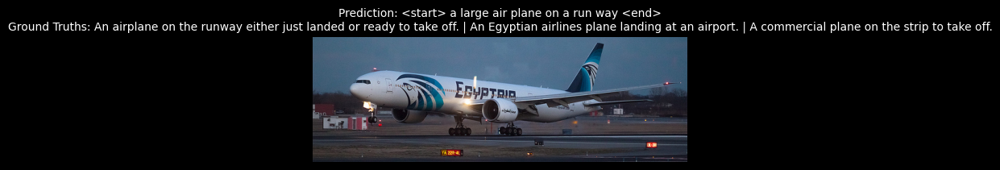

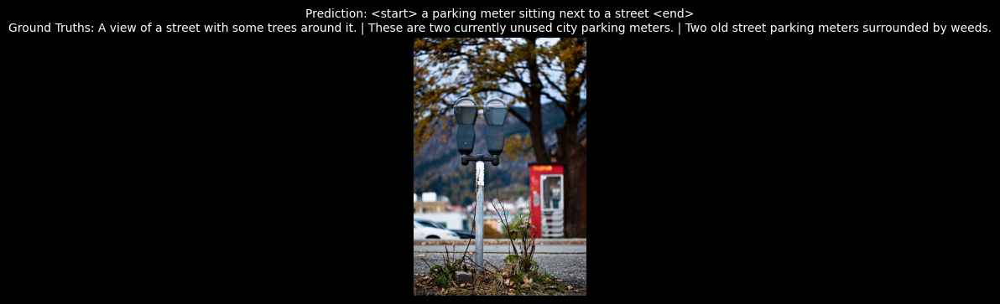

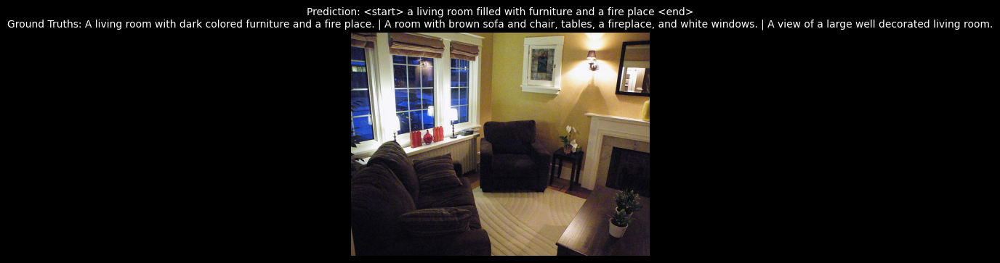

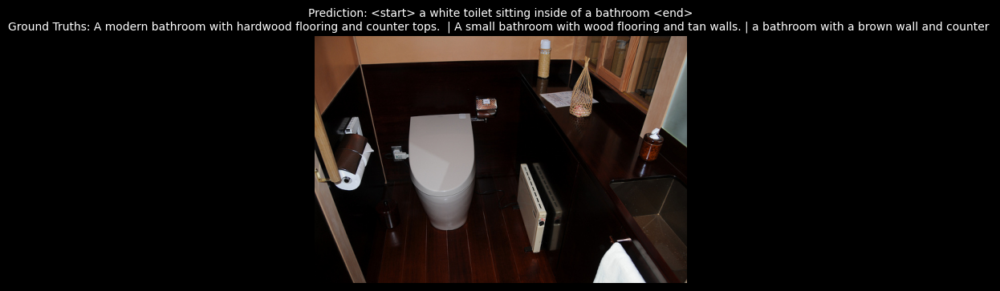

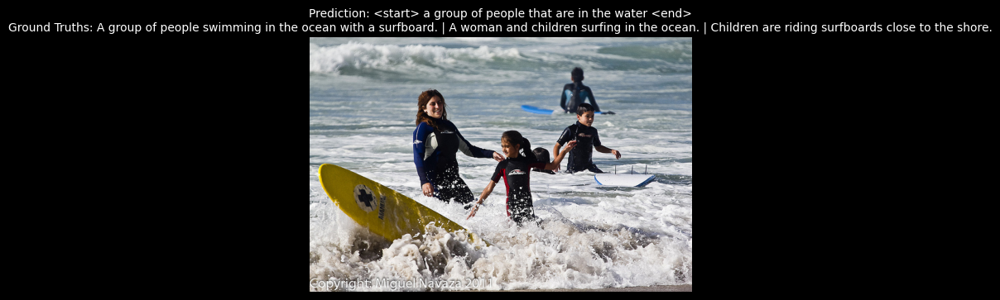

...

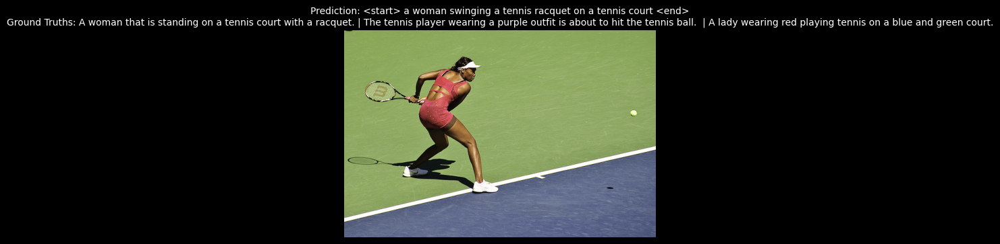

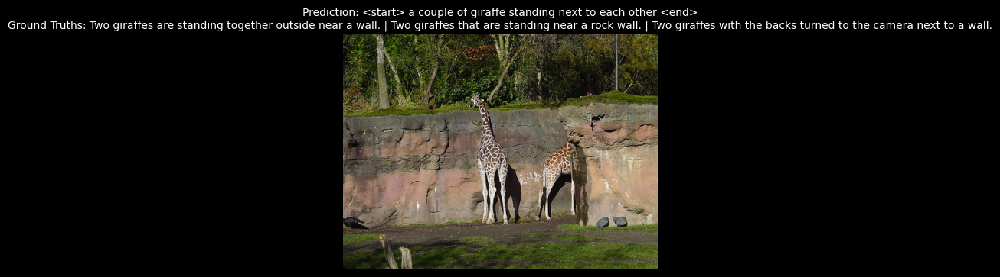

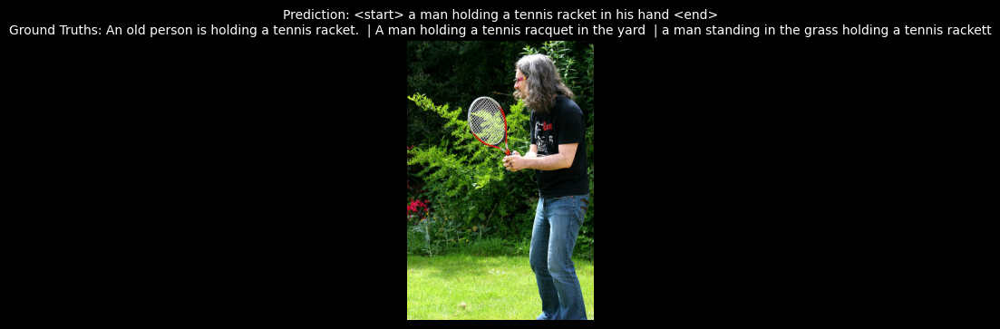

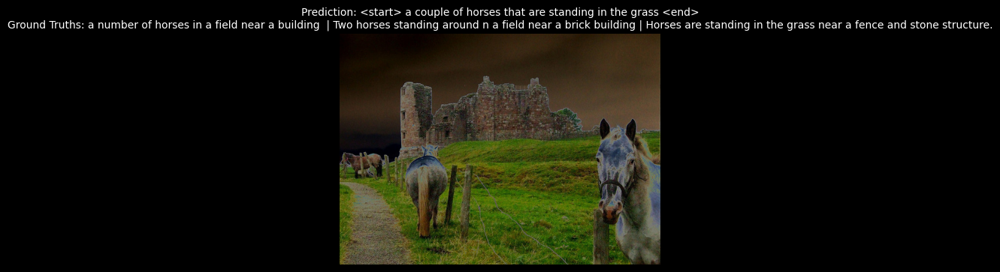

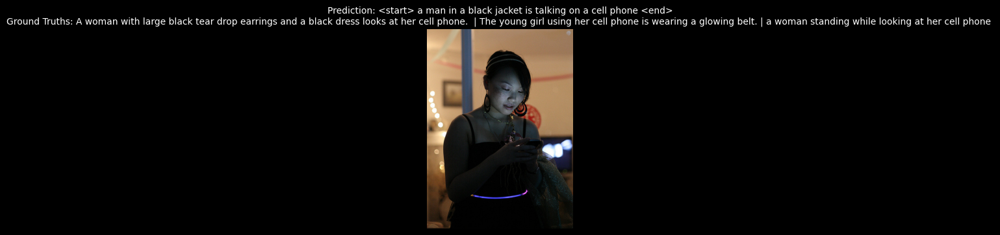

In [13]:
for (img, pred_words), img_id in zip(batch, selected):
    # Load ground truth captions
    ann_ids = coco.getAnnIds(imgIds=img_id)
    gts = [ann['caption'] for ann in coco.loadAnns(ann_ids)]

    # Plot
    plt.figure(figsize=(6,4))
    plt.imshow(img)
    plt.axis('off')
    title = f"Prediction: {' '.join(pred_words)}\nGround Truths: " + " | ".join(gts[:3])
    plt.title(title, fontsize=10)
    plt.show()

In [16]:
# Cell X – Write results (images + captions + BLEU) to a Word document
from docx import Document
from docx.shared import Inches
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
from io import BytesIO
import nltk
nltk.download('punkt')  # if not already

# Create the document
doc = Document()
doc.add_heading('Val Images Captioning Results', level=1)

smooth_fn = SmoothingFunction().method1

for (pil_img, pred_words), img_id in zip(batch, selected):
    # Load ground truth captions
    ann_ids = coco.getAnnIds(imgIds=img_id)
    gts = [ann['caption'] for ann in coco.loadAnns(ann_ids)]
    
    # Tokenize references and hypothesis
    references = [gt.split() for gt in gts]
    hypothesis = pred_words
    
    # Compute BLEU (with smoothing)
    bleu = sentence_bleu(references, hypothesis, smoothing_function=smooth_fn)
    
    # Insert image
    buf = BytesIO()
    pil_img.save(buf, format='PNG')
    buf.seek(0)
    doc.add_picture(buf, width=Inches(4))
    
    # Add text: prediction, GTs, BLEU
    p = doc.add_paragraph()
    p.add_run("Prediction: ").bold = True
    p.add_run(' '.join(pred_words) + "\n")
    p.add_run("Ground Truths: ").bold = True
    p.add_run(" | ".join(gts[:3]) + "\n")
    p.add_run(f"BLEU Score: {bleu:.4f}")
    
    # Page break after each image
    doc.add_page_break()

# Save the Word document
OUTPUT_DOC = "Val_image_captioning_results.docx"
doc.save(OUTPUT_DOC)
print(f"Saved results to {OUTPUT_DOC}")


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\uparp\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt.zip.


Saved results to Val_image_captioning_results.docx
